# Necessary library

In [2]:
import pandas as pd
import numpy as np

import os
import sys

import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio


import keras
import tensorflow
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint                        
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import to_categorical  

# Data Preparation

In [3]:

from pathlib import Path
# Đường dẫn đến thư mục chứa file .wav
filepaths = Path('Dataset/converted_wav')  

# Lấy danh sách các file .wav trong thư mục
file_names = list(filepaths.glob('*.wav'))  

# Chuyển danh sách đường dẫn thành danh sách các đường dẫn đầy đủ (bao gồm cả thư mục)
audio_data = [str(file) for file in file_names]





In [4]:
audio_data

['Dataset\\converted_wav\\recorded_audio.wav',
 'Dataset\\converted_wav\\recorded_audio_02jmPGL.wav',
 'Dataset\\converted_wav\\recorded_audio_03k88ok.wav',
 'Dataset\\converted_wav\\recorded_audio_08AxQ5T.wav',
 'Dataset\\converted_wav\\recorded_audio_08oFo0W.wav',
 'Dataset\\converted_wav\\recorded_audio_0bJpmSM.wav',
 'Dataset\\converted_wav\\recorded_audio_0cAbXnW.wav',
 'Dataset\\converted_wav\\recorded_audio_0CQyKuq.wav',
 'Dataset\\converted_wav\\recorded_audio_0gNmgd9.wav',
 'Dataset\\converted_wav\\recorded_audio_0J52MEJ.wav',
 'Dataset\\converted_wav\\recorded_audio_0kxS3Qd.wav',
 'Dataset\\converted_wav\\recorded_audio_0myWVxZ.wav',
 'Dataset\\converted_wav\\recorded_audio_0NKAqN3.wav',
 'Dataset\\converted_wav\\recorded_audio_0od48Xz.wav',
 'Dataset\\converted_wav\\recorded_audio_0qU1vGN.wav',
 'Dataset\\converted_wav\\recorded_audio_0rJ1um4.wav',
 'Dataset\\converted_wav\\recorded_audio_0sXcBMX.wav',
 'Dataset\\converted_wav\\recorded_audio_0UbW71l.wav',
 'Dataset\\convert

In [5]:
from IPython.display import Audio

# Lấy file đầu tiên
first_audio_file = audio_data[0]

# Phát âm thanh
Audio(first_audio_file)

In [6]:
label_file = pd.read_csv('Dataset/metadata.csv', delimiter='|')


In [7]:
label_file

,id,utterance,description,emotion,date_created,status,gender,age,level,audio_recording,user_id
0,1,Hannu wrote of his expedition in stone.,{user_id} said {transcription} in a {emotion} ...,Sarcastic,2022-05-04 15:57:16.957078,Complete,Female,20s,3,wavs/recorded_audio_A0MwoOW.webm,3
1,2,Little India differs from many other neighbour...,{transcription} said {user_id} in a {emotion} ...,Excited,2022-05-04 16:04:21.841726,Complete,Female,20s,6,wavs/recorded_audio_nZB5ujA.webm,3
2,3,Users had the ability to vote on the songs the...,{user_id} said {transcription} With a {emotion...,Neutral,2022-05-04 16:24:47.767515,Complete,Female,20s,0,wavs/recorded_audio.webm,3
3,4,"His major sponsor is Algario Communications, a...","In an {emotion} voice, {user_id} says {transcr...",Surprised,2022-05-04 16:09:25.118523,Complete,Female,20s,8,wavs/recorded_audio_6emr1kD.webm,3
4,5,The mansion also has a marriage office.,"In an {emotion} voice, {user_id} says {transcr...",Sarcastic,2022-05-11 10:29:13.448873,Complete,Female,20s,4,wavs/recorded_audio_ReBGM47.webm,3
...,...,...,...,...,...,...,...,...,...,...,...
1200,1204,Smugglers and wreckers were apparently numerou...,{user_id} said {transcription} With a {emotion...,Disgust,2022-08-19 11:24:48.285343,Complete,Female,20s,0,wavs/recorded_audio_jcDo7ph.webm,3
1201,1209,Most of the disadvantages are about the way pe...,{user_id} said {transcription} With a {emotion...,Neutral,2022-08-19 11:26:05.990888,Complete,Female,20s,0,wavs/recorded_audio_KJ0i2zh.webm,3
1202,1210,"The other characters who appeared are Oscar, S...","In an {emotion} voice, {user_id} says {transcr...",Sarcastic,2022-08-19 11:26:40.342226,Complete,Female,20s,0,wavs/recorded_audio_DdUVAgO.webm,3
1203,1213,The first Olympiad was unofficial.,"With a {emotion} voice, {user_id} said {transc...",Sad,2022-08-19 11:27:57.140124,Complete,Female,20s,9,wavs/recorded_audio_ZJ7BcZu.webm,3


In [8]:
label=label_file[['audio_recording','emotion']]
label['audio_recording'] = label['audio_recording'].apply(lambda x: x.split('/')[-1]) # lay phan sau  '/'
label["audio_recording"] = label["audio_recording"].str.replace(".webm", ".wav", regex=False) # chuyen duoi .webm sang .wav

C:\Users\Legion\AppData\Local\Temp\ipykernel_45984\363994709.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  label['audio_recording'] = label['audio_recording'].apply(lambda x: x.split('/')[-1]) # lay phan sau  '/'
C:\Users\Legion\AppData\Local\Temp\ipykernel_45984\363994709.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  label["audio_recording"] = label["audio_recording"].str.replace(".webm", ".wav", regex=False) # chuyen duoi .webm sang .wav


In [9]:
label

,audio_recording,emotion
0,recorded_audio_A0MwoOW.wav,Sarcastic
1,recorded_audio_nZB5ujA.wav,Excited
2,recorded_audio.wav,Neutral
3,recorded_audio_6emr1kD.wav,Surprised
4,recorded_audio_ReBGM47.wav,Sarcastic
...,...,...
1200,recorded_audio_jcDo7ph.wav,Disgust
1201,recorded_audio_KJ0i2zh.wav,Neutral
1202,recorded_audio_DdUVAgO.wav,Sarcastic
1203,recorded_audio_ZJ7BcZu.wav,Sad


In [10]:
# Tìm đường dẫn tương ứng và thêm vào cột 'full_path'
def find_full_path(file_name):
    # Duyệt qua audio_data để tìm file phù hợp
    for audio_path in audio_data:
        if Path(audio_path).name == file_name:  # So sánh tên file
            return str(audio_path)  # Trả về đường dẫn đầy đủ
    return None  # Trả về None nếu không tìm thấy file

# Áp dụng hàm để thêm cột 'full_path'
label['full_path'] = label['audio_recording'].apply(find_full_path)

# Kiểm tra các file không tìm thấy
missing_files = label[label['full_path'].isnull()]
label = label.dropna(subset=['full_path']).reset_index(drop=True)




C:\Users\Legion\AppData\Local\Temp\ipykernel_45984\2791218575.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  label['full_path'] = label['audio_recording'].apply(find_full_path)


In [11]:
label['full_path'] = label['full_path'].astype(str)

In [12]:
label

,audio_recording,emotion,full_path
0,recorded_audio_A0MwoOW.wav,Sarcastic,Dataset\converted_wav\recorded_audio_A0MwoOW.wav
1,recorded_audio_nZB5ujA.wav,Excited,Dataset\converted_wav\recorded_audio_nZB5ujA.wav
2,recorded_audio.wav,Neutral,Dataset\converted_wav\recorded_audio.wav
3,recorded_audio_6emr1kD.wav,Surprised,Dataset\converted_wav\recorded_audio_6emr1kD.wav
4,recorded_audio_ReBGM47.wav,Sarcastic,Dataset\converted_wav\recorded_audio_ReBGM47.wav
...,...,...,...
1176,recorded_audio_jcDo7ph.wav,Disgust,Dataset\converted_wav\recorded_audio_jcDo7ph.wav
1177,recorded_audio_KJ0i2zh.wav,Neutral,Dataset\converted_wav\recorded_audio_KJ0i2zh.wav
1178,recorded_audio_DdUVAgO.wav,Sarcastic,Dataset\converted_wav\recorded_audio_DdUVAgO.wav
1179,recorded_audio_ZJ7BcZu.wav,Sad,Dataset\converted_wav\recorded_audio_ZJ7BcZu.wav


# Data Visualisation and Exploration

In [13]:
label['emotion'].value_counts()

emotion
Disgust      162
Happy        157
Surprised    151
Excited      150
Neutral      149
Sad          147
Sarcastic    139
Angry        126
Name: count, dtype: int64

C:\Users\Legion\AppData\Local\Temp\ipykernel_45984\638057595.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=label, x='emotion', palette='Set2')


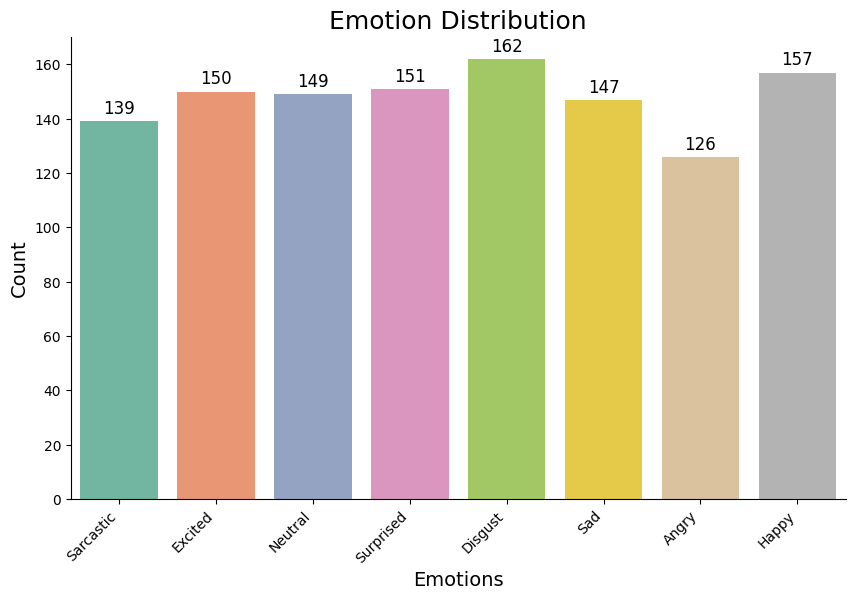

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 6))


sns.countplot(data=label, x='emotion', palette='Set2')

plt.title('Emotion Distribution', fontsize=18)
plt.xlabel('Emotions', fontsize=14)
plt.ylabel('Count', fontsize=14)

for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height():.0f}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', 
                       fontsize=12, color='black', 
                       xytext=(0, 9), textcoords='offset points')


sns.despine(top=True, right=True, left=False, bottom=False)


plt.xticks(rotation=45, ha='right')  
plt.show()


In [15]:

# Hàm tạo Waveplot
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    librosa.display.waveshow(data, sr=sr, color='deepskyblue', alpha=0.7, lw=2)
    plt.show()

# Hàm tạo Spectrogram
def create_spectrogram(data, sr, e):
    # Tính Short-Time Fourier Transform (STFT)
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))  # Chuyển đổi biên độ sang decibel 
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')  
    plt.colorbar(format='%+2.0f dB') 
    plt.xlabel('Time (s)', size=12)
    plt.ylabel('Frequency (Hz)', size=12)
    plt.show()



Neutral

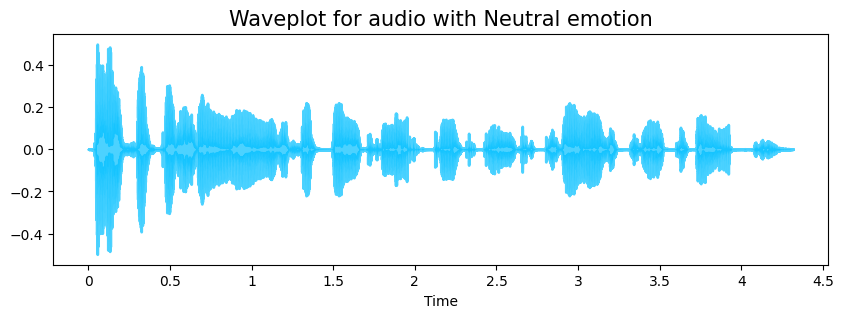

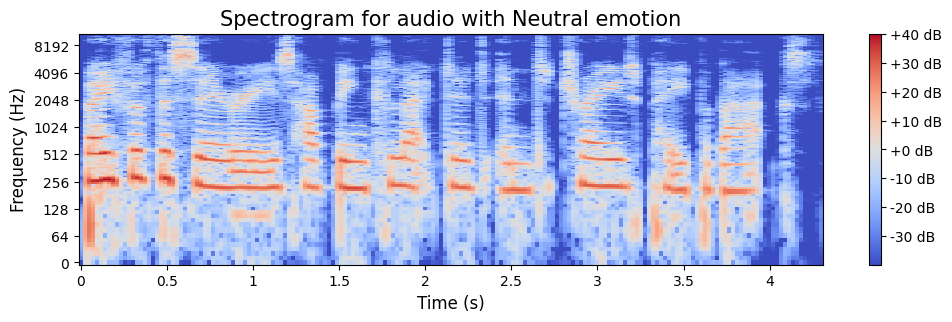

In [16]:
emotion = 'Neutral'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Sad 

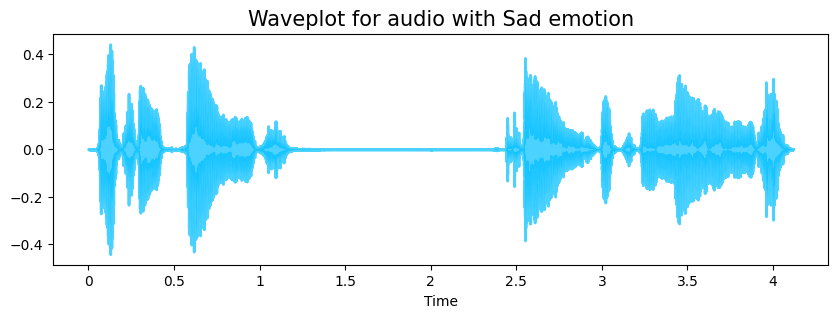

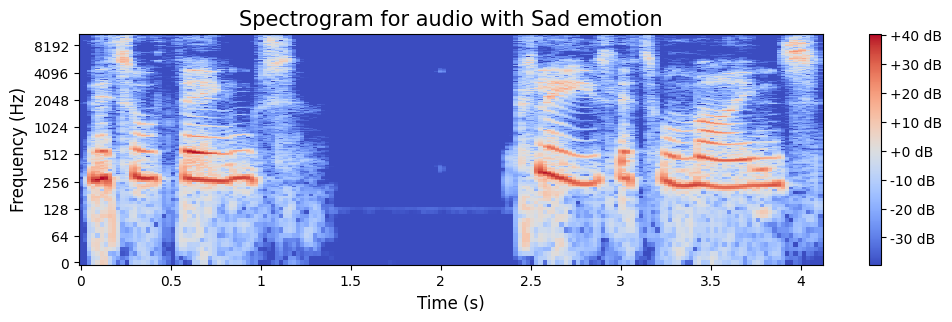

In [17]:
emotion = 'Sad'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Sarcastic

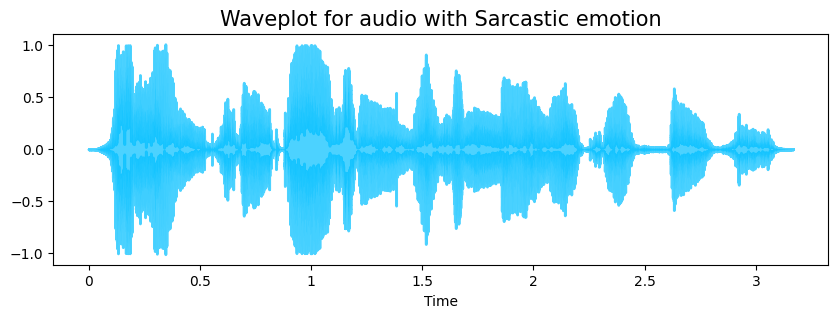

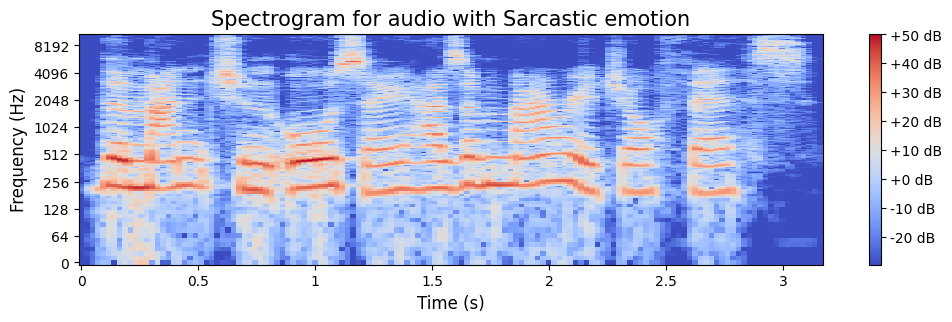

In [18]:
emotion = 'Sarcastic'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Angry

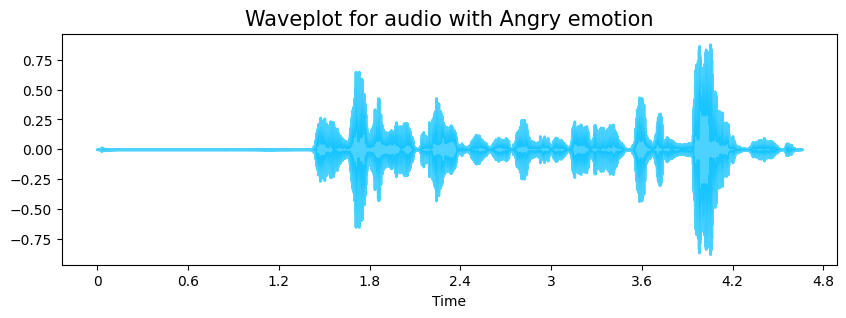

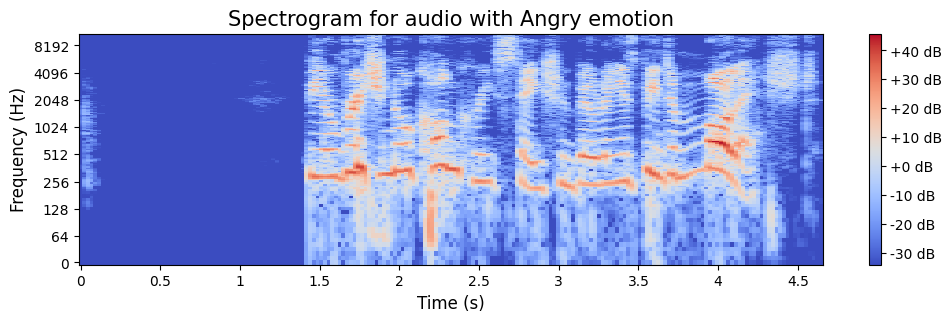

In [19]:
emotion = 'Angry'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Disgust

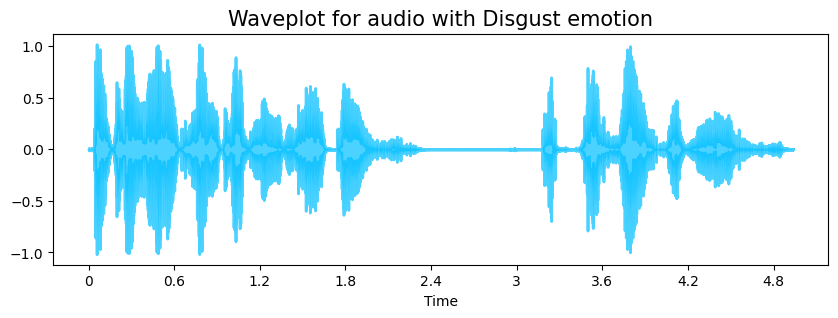

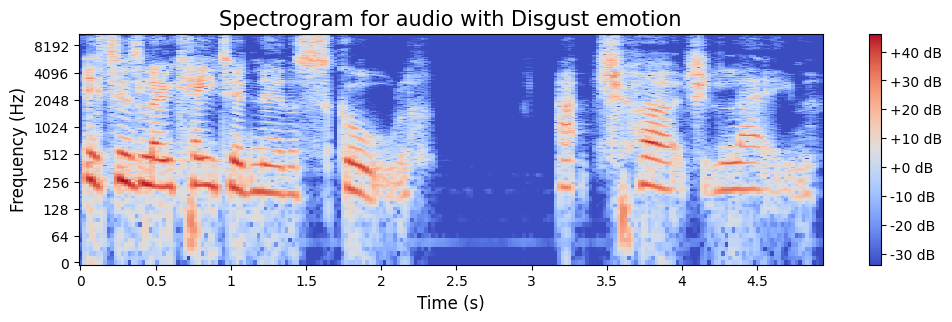

In [20]:
emotion = 'Disgust'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Happy

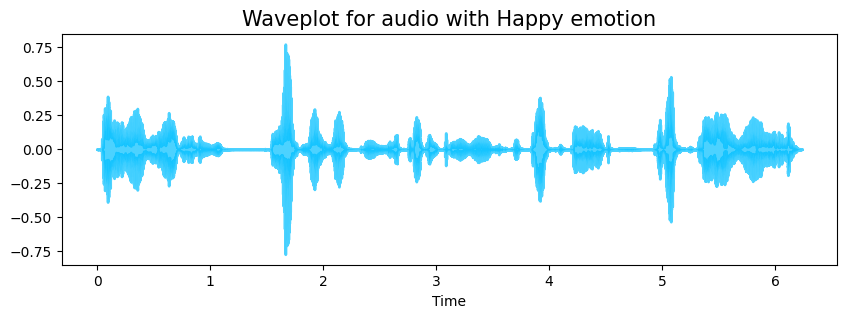

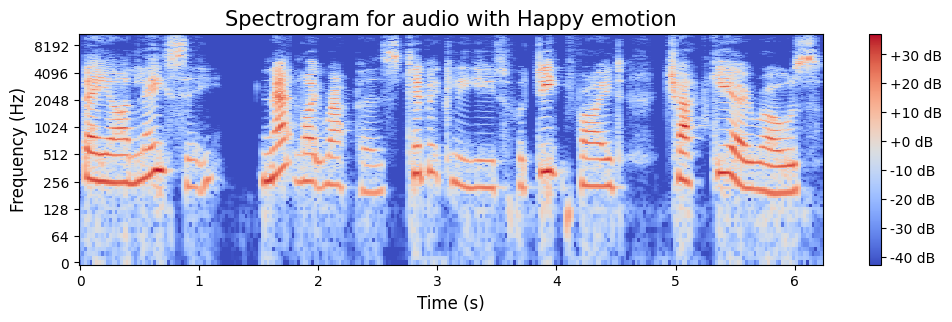

In [21]:
emotion = 'Happy'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Surprised 

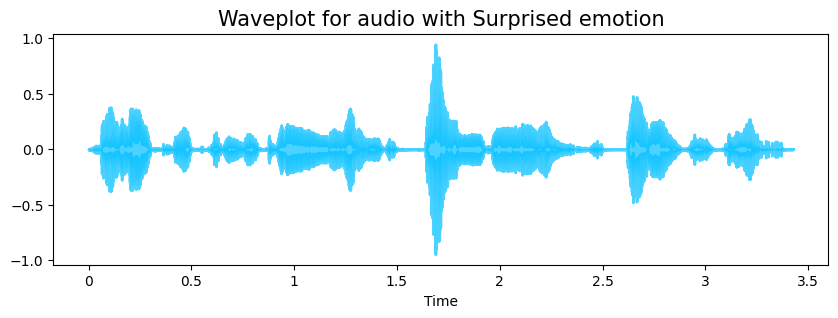

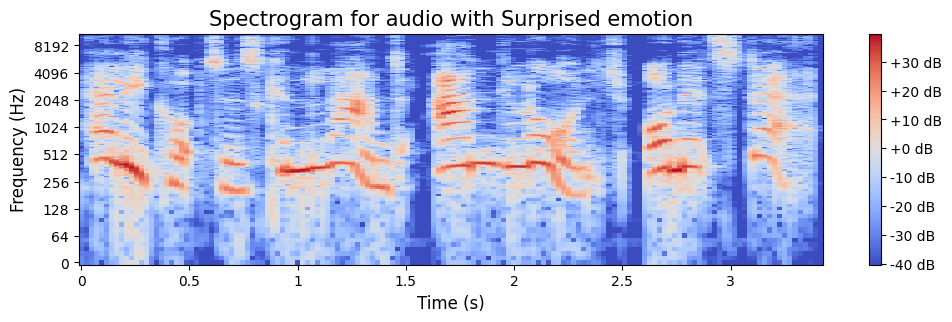

In [22]:
emotion = 'Surprised'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


Excited

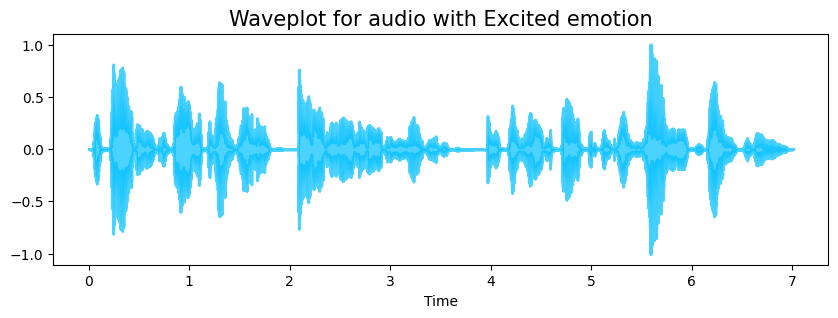

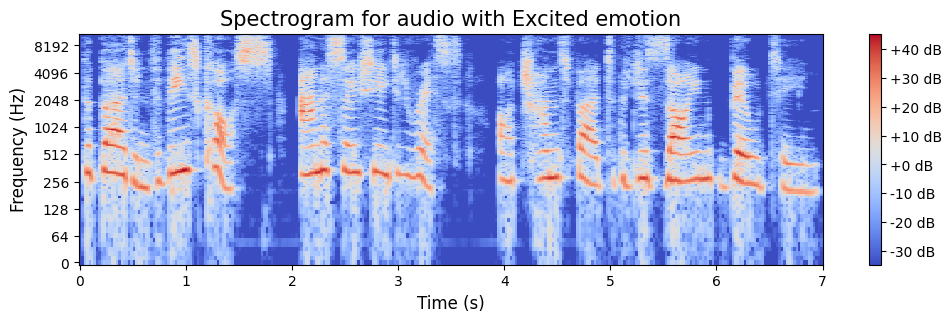

In [23]:
emotion = 'Excited'

path = np.array(label['full_path'][label['emotion'] == emotion])[1]  

data, sampling_rate = librosa.load(path)

create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)

Audio(path)


# Feature Extraction
We'll extract MFCC features from each audio file. MFCCs capture the timbral aspects of audio, which are crucial for emotion recognition.


In [24]:

import librosa
import numpy as np

# Define parameters for MFCC extraction
MFCCS = 40
MAX_PAD = 174  # This value may vary depending on the dataset

def extract_features(file_path, max_pad=MAX_PAD, mfccs=MFCCS):
    try:
        data, sampling_rate = librosa.load(file_path, sr=None, duration=2.5, offset=0.6)
        # Ensure consistency in length
        if len(data) < 22050 * 3:  # Assuming sampling rate of 22050 Hz
            padding = 22050 * 3 - len(data)
            data = np.pad(data, (0, padding), 'constant')
        # Extract MFCC features
        mfcc = librosa.feature.mfcc(y=data, sr=sampling_rate, n_mfcc=mfccs)
        mfcc = mfcc.T
        # Pad sequences to have the same length
        if len(mfcc) < max_pad:
            pad_width = max_pad - len(mfcc)
            mfcc = np.pad(mfcc, pad_width=((0, pad_width), (0, 0)), mode='constant')
        else:
            mfcc = mfcc[:max_pad]
        return mfcc
    except Exception as e:
        print(f"Error encountered while parsing file: {file_path}")
        return None

# Apply the feature extraction to all audio files
features = []
for index, row in label.iterrows():
    file_path = row['full_path']
    mfcc = extract_features(file_path)
    if mfcc is not None:
        features.append(mfcc)

# Convert to numpy array
X = np.array(features)

print(f"Feature extraction completed. Shape of X: {X.shape}")


Feature extraction completed. Shape of X: (1181, 174, 40)


# Preparing the Dataset
We'll create the feature matrix `X` and the label vector `y` for our model.


In [25]:

# Extract labels
y = label['emotion'].values

print(f"Number of samples: {X.shape[0]}")
print(f"Number of labels: {len(y)}")


Number of samples: 1181
Number of labels: 1181


# Label Encoding
We'll encode the emotion labels into numerical format using `OneHotEncoder`.


In [27]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Encode labels with values between 0 and n_classes-1
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(y)

# One-hot encode
onehot_encoder = OneHotEncoder(sparse_output=False)  # Use sparse_output instead of sparse
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
y_encoded = onehot_encoder.fit_transform(integer_encoded)

print(f"Classes: {list(label_encoder.classes_)}")
print(f"Shape of y_encoded: {y_encoded.shape}")


Classes: ['Angry', 'Disgust', 'Excited', 'Happy', 'Neutral', 'Sad', 'Sarcastic', 'Surprised']
Shape of y_encoded: (1181, 8)


# Train-Test Split
We'll split the dataset into training and testing sets with a ratio of 80:20.


In [28]:
from sklearn.model_selection import train_test_split

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Training set shape: {X_train.shape}, {y_train.shape}")
print(f"Testing set shape: {X_test.shape}, {y_test.shape}")


Training set shape: (944, 174, 40), (944, 8)
Testing set shape: (237, 174, 40), (237, 8)


# Building the CNN Model
We'll define a CNN architecture suitable for processing MFCC features.


In [29]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Dropout, Flatten, Dense, BatchNormalization
from keras.optimizers import Adam

# Define the CNN model
model = Sequential()

# 1st Conv layer
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# 2nd Conv layer
model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# 3rd Conv layer
model.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.3))

# Flatten and Dense layers
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(y_train.shape[1], activation='softmax'))

# Compile the model
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


c:\Users\Legion\Documents\NCKH-SER-GITHUB\.conda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 172, 64)        │         7,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 172, 64)        │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 86, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 86, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 84, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 84, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 42, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 42, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 40, 256)        │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 40, 256)        │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 20, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 20, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5120)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       655,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 789,320 (3.01 MB)

 Trainable params: 788,424 (3.01 MB)

 Non-trainable params: 896 (3.50 KB)

# Training the Model
We'll train the CNN using the training data and validate it on the testing data. Callbacks will help in optimizing the training process.


In [31]:
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# Define callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True, verbose=1)  # Update file extension

callbacks = [reduce_lr, early_stop, checkpoint]

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=callbacks,
    verbose=1
)


Epoch 1/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.1601 - loss: 3.4515
Epoch 1: val_loss improved from inf to 2.99644, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - accuracy: 0.1600 - loss: 3.4439 - val_accuracy: 0.1392 - val_loss: 2.9964 - learning_rate: 1.0000e-04
Epoch 2/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2210 - loss: 2.6965
Epoch 2: val_loss improved from 2.99644 to 2.31707, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.2207 - loss: 2.6953 - val_accuracy: 0.1266 - val_loss: 2.3171 - learning_rate: 1.0000e-04
Epoch 3/100
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.2419 - loss: 2.3433
Epoch 3: val_loss improved from 2.31707 to 2.09340, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.2407 - loss: 2.3399 - val_accuracy: 0.1392 - val_loss: 2.0934 - learning_rate: 1.0000e-04
Epoch 4/100
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accur

# Evaluating the Model
We'll evaluate the model's performance on the testing set and visualize the training history.


Test Accuracy: 18.99%
Test Loss: 2.0355
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Classification Report:
              precision    recall  f1-score   support

       Angry       0.20      0.12      0.15        25
     Disgust       0.09      0.09      0.09        33
     Excited       0.25      0.10      0.14        30
       Happy       0.21      0.16      0.18        32
     Neutral       0.31      0.53      0.40        30
         Sad       0.13      0.41      0.20        29
   Sarcastic       0.33      0.07      0.12        28
   Surprised       0.20      0.03      0.06        30

    accuracy                           0.19       237
   macro avg       0.22      0.19      0.17       237
weighted avg       0.21      0.19      0.17       237



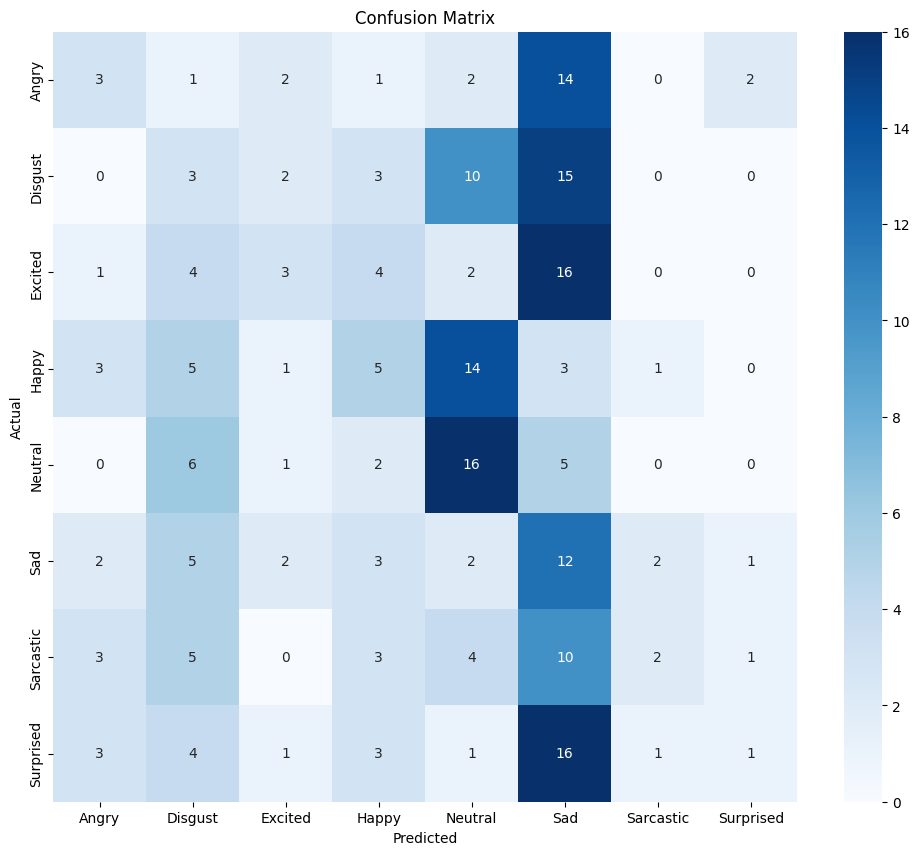

In [34]:
# Load the best saved model
from keras.models import load_model

best_model = load_model('best_model.keras')

# Evaluate on test data
test_loss, test_accuracy = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

# Generate predictions
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=label_encoder.classes_))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_, cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()


# Visualizing Training History
We'll plot the accuracy and loss curves for training and validation sets.


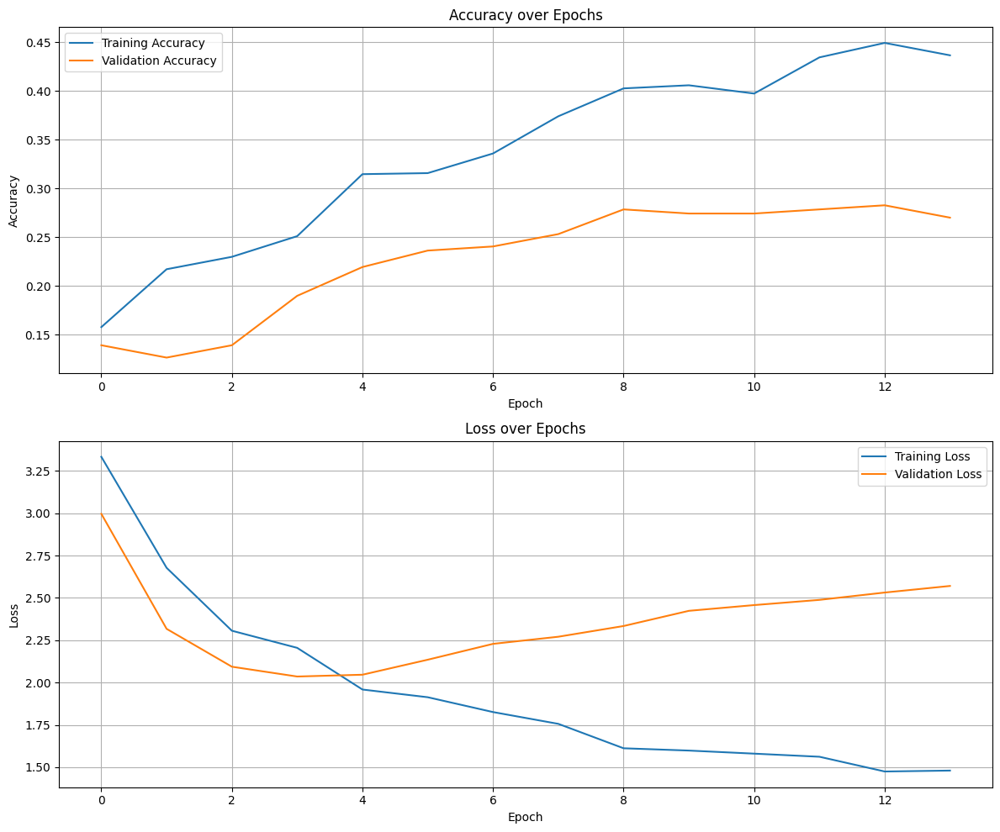

In [35]:
# Plotting training & validation accuracy and loss
fig, axs = plt.subplots(2, 1, figsize=(12, 10))

# Accuracy plot
axs[0].plot(history.history['accuracy'], label='Training Accuracy')
axs[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].set_title('Accuracy over Epochs')
axs[0].legend()
axs[0].grid(True)

# Loss plot
axs[1].plot(history.history['loss'], label='Training Loss')
axs[1].plot(history.history['val_loss'], label='Validation Loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].set_title('Loss over Epochs')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()
